# Libraries

In [ ]:
import torch
import torch.nn as nn
from torchvision import transforms
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm

from PIL import Image
import numpy as np
import os
import zipfile
import glob
from skimage import color
from matplotlib import pyplot as plt

import time

In [ ]:
!pip install torchmetrics

from torchmetrics import functional

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 517.2/517.2 KB 21.9 MB/s eta 0:00:00


# Hyper Parameters

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
lr = 2e-4
batch_size = 16
n_workers = 2
img_size = 256
L1_lambda = 100
n_epochs = 50
n_samples = 1000

# Networks

In [ ]:
class PatchGAN(nn.Module):

    def __init__(self, in_channels = 4, out_channels = 1):
        super().__init__()
        
        features = [64, 128, 256, 512]

        self.model = nn.Sequential(
            nn.Conv2d(in_channels, features[0], kernel_size = 4, stride = 2, padding = 1, padding_mode = 'reflect'),
            nn.LeakyReLU(0.2),
            nn.Conv2d(features[0], features[1], kernel_size = 4, stride = 2, padding = 1, padding_mode = 'reflect'),
            nn.BatchNorm2d(features[1]),
            nn.LeakyReLU(0.2),
            nn.Conv2d(features[1], features[2], kernel_size = 4, stride = 2, padding = 1, padding_mode = 'reflect'),
            nn.BatchNorm2d(features[2]),
            nn.LeakyReLU(0.2),
            nn.Conv2d(features[2], features[3], kernel_size = 4, stride = 1, padding = 1, padding_mode = 'reflect'),
            nn.BatchNorm2d(features[3]),
            nn.LeakyReLU(0.2),
            nn.Conv2d(features[3], out_channels, kernel_size = 4, stride = 1, padding = 1, padding_mode = 'reflect')
        )

    def forward(self, x, y):
        x = torch.cat([x, y], dim = 1) # we are using a conditional GAN so the input of the discriminator must include the input of the generator
        return self.model(x)

In [ ]:
def test_discriminator():
    x = torch.randn((16, 3, 256, 256))
    y = torch.randn((16, 1, 256, 256))
    model = PatchGAN()
    preds = model(x, y)
    print(preds.shape)

test_discriminator()

torch.Size([16, 1, 30, 30])


In [ ]:
class Critic(nn.Module):

    def __init__(self, in_channels = 4, out_channels = 1):
        super().__init__()
        
        features = [64, 128, 256, 512]

        self.model = nn.Sequential(
            nn.Conv2d(in_channels, features[0], kernel_size = 4, stride = 2, padding = 1, padding_mode = 'reflect'),
            nn.LeakyReLU(0.2),
            nn.Conv2d(features[0], features[1], kernel_size = 4, stride = 2, padding = 1, padding_mode = 'reflect'),
            nn.InstanceNorm2d(features[1], affine=True),
            nn.LeakyReLU(0.2),
            nn.Conv2d(features[1], features[2], kernel_size = 4, stride = 2, padding = 1, padding_mode = 'reflect'),
            nn.InstanceNorm2d(features[2], affine=True),
            nn.LeakyReLU(0.2),
            nn.Conv2d(features[2], features[3], kernel_size = 4, stride = 1, padding = 1, padding_mode = 'reflect'),
            nn.InstanceNorm2d(features[3], affine=True),
            nn.LeakyReLU(0.2),
            nn.Conv2d(features[3], out_channels, kernel_size = 4, stride = 1, padding = 1, padding_mode = 'reflect')
        )

    def forward(self, x, y):
        x = torch.cat([x, y], dim = 1) # we are using a conditional GAN so the input of the discriminator must include the input of the generator
        return self.model(x)

In [ ]:
def test_critic():
    x = torch.randn((16, 3, 256, 256))
    y = torch.randn((16, 1, 256, 256))
    model = Critic()
    preds = model(x, y)
    print(preds.shape)

test_critic()

torch.Size([16, 1, 30, 30])


In [ ]:
class UNet(nn.Module):
    
    def __init__(self, in_channels = 1, out_channels = 3):
        super().__init__()
        
        self.pool_layer = nn.MaxPool2d(kernel_size = 2, stride = 2)

        self.encoder_block_1 = nn.Sequential(
            nn.Conv2d(in_channels = in_channels, out_channels = 64, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(num_features = 64),
            nn.ReLU(),
            nn.Conv2d(in_channels = 64, out_channels = 64, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(num_features = 64),
            nn.ReLU()
            )

        self.encoder_block_2 = nn.Sequential(
            nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(num_features = 128),
            nn.ReLU(),
            nn.Conv2d(in_channels = 128, out_channels = 128, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(num_features = 128),
            nn.ReLU()
        )
        
        self.encoder_block_3 = nn.Sequential(
            nn.Conv2d(in_channels = 128, out_channels = 256, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(num_features = 256),
            nn.ReLU(),
            nn.Conv2d(in_channels = 256, out_channels = 256, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(num_features = 256),
            nn.ReLU()
        )

        self.encoder_block_4 = nn.Sequential(
            nn.Conv2d(in_channels = 256, out_channels = 512, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(num_features = 512),
            nn.ReLU(),
            nn.Conv2d(in_channels = 512, out_channels = 512, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(num_features = 512),
            nn.ReLU()
        )

        self.middle_block = nn.Sequential(
            nn.Conv2d(in_channels = 512, out_channels = 1024, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(num_features = 1024),
            nn.ReLU(),
            nn.Conv2d(in_channels = 1024, out_channels = 1024, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(num_features = 1024),
            nn.ReLU()
        )

        self.upsampling_block_4 = nn.ConvTranspose2d(in_channels = 1024, out_channels = 512, kernel_size=2, stride=2)

        self.decoder_block_4 = nn.Sequential(
            nn.Conv2d(in_channels = 512 + 512, out_channels = 512, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(num_features = 512),
            nn.ReLU(),
            nn.Conv2d(in_channels = 512, out_channels = 512, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(num_features = 512),
            nn.ReLU(),
        )

        self.upsampling_block_3 = nn.ConvTranspose2d(in_channels = 512, out_channels = 256, kernel_size=2, stride=2)

        self.decoder_block_3 = nn.Sequential(
            nn.Conv2d(in_channels = 256 + 256, out_channels = 256, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(num_features = 256),
            nn.ReLU(),
            nn.Conv2d(in_channels = 256, out_channels = 256, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(num_features = 256),
            nn.ReLU(),
        )

        self.upsampling_block_2 = nn.ConvTranspose2d(in_channels = 256, out_channels = 128, kernel_size=2, stride=2)

        self.decoder_block_2 = nn.Sequential(
            nn.Conv2d(in_channels = 128 + 128, out_channels = 128, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(num_features = 128),
            nn.ReLU(),
            nn.Conv2d(in_channels = 128, out_channels = 128, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(num_features = 128),
            nn.ReLU(),
        )

        self.upsampling_block_1 = nn.ConvTranspose2d(in_channels = 128, out_channels = 64, kernel_size=2, stride=2)
        
        self.decoder_block_1 = nn.Sequential(
            nn.Conv2d(in_channels = 64 + 64, out_channels = 64, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(num_features = 64),
            nn.ReLU(),
            nn.Conv2d(in_channels = 64, out_channels = 64, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(num_features = 64),
            nn.ReLU(),
        )

        self.final_block = nn.Conv2d(in_channels = 64, out_channels = out_channels, kernel_size = 1)
        
        
    def forward(self, x):
        enc1 = self.encoder_block_1(x)
        enc2 = self.encoder_block_2(self.pool_layer(enc1))
        enc3 = self.encoder_block_3(self.pool_layer(enc2))
        enc4 = self.encoder_block_4(self.pool_layer(enc3))

        mid = self.middle_block(self.pool_layer(enc4))

        dec4 = self.upsampling_block_4(mid)
        dec4 = torch.cat([dec4, enc4], dim=1) # skip connection
        dec4 = self.decoder_block_4(dec4)

        dec3 = self.upsampling_block_3(dec4)
        dec3 = torch.cat([dec3, enc3], dim=1) # skip connection
        dec3 = self.decoder_block_3(dec3)

        dec2 = self.upsampling_block_2(dec3)
        dec2 = torch.cat([dec2, enc2], dim=1) # skip connection
        dec2 = self.decoder_block_2(dec2)

        dec1 = self.upsampling_block_1(dec2)
        dec1 = torch.cat([dec1, enc1], dim=1) # skip connection
        dec1 = self.decoder_block_1(dec1)

        return torch.sigmoid(self.final_block(dec1))

In [ ]:
def test_generator():
    x = torch.randn((1, 1, 256, 256))
    model = UNet()
    preds = model(x)
    print(preds.shape)

test_generator()

torch.Size([1, 3, 256, 256])


# Obtaining the Coco Dataset

In [ ]:
!wget http://images.cocodataset.org/zips/val2017.zip -O "/content/train2017.zip"

--2023-02-10 09:24:38--  http://images.cocodataset.org/zips/val2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 3.5.11.226, 52.217.79.20, 52.216.240.188, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|3.5.11.226|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 815585330 (778M) [application/zip]
Saving to: ‘/content/train2017.zip’

/content/train2017. 100%[===================>] 777.80M  95.4MB/s    in 8.1s    

2023-02-10 09:24:46 (95.7 MB/s) - ‘/content/train2017.zip’ saved [815585330/815585330]



In [ ]:
zip_ref = zipfile.ZipFile('/content/train2017.zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()

# Defining our Datasets

In [ ]:
path = "/content/val2017"
paths = glob.glob(path + "/*.jpg")
np.random.seed(2052415)

paths_subset = np.random.choice(paths, n_samples, replace = False)
rand = np.random.permutation(n_samples)
train_indexes = rand[:(int)(n_samples * 0.8)]
test_indexes = rand[(int)(n_samples * 0.8):]

train_paths = paths_subset[train_indexes]
test_paths = paths_subset[test_indexes]

In [ ]:
class GrayRGB(Dataset):
    def __init__(self, paths):
        self.size = img_size
        self.paths = paths

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, index):
        img = Image.open(self.paths[index]).convert("RGB")
        img = transforms.Resize((self.size, self.size))(img)
        img = np.array(img).astype("float32") / 255 # values in [0, 1]
       
        img_gray = color.rgb2gray(img).astype("float32")
        img_gray = transforms.ToTensor()(img_gray)
        img_rgb = transforms.ToTensor()(img) 
        

        return {"gray" : img_gray, "rgb" : img_rgb}

In [ ]:
class LabRGB(Dataset):
    def __init__(self, paths):
        self.size = img_size
        self.paths = paths

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, index):
        img = Image.open(self.paths[index]).convert("RGB")
        img = transforms.Resize((self.size, self.size))(img)
        img = np.array(img)
        img_Lab = color.rgb2lab(img).astype("float32")
        img_L = img_Lab[:, :, :1] / 100 # values in [0, 1]
        img_ab = (img_Lab[:, :, 1:] + 128) / 255 # values in [0, 1]
        img_L = transforms.ToTensor()(img_L)
        img_ab = transforms.ToTensor()(img_ab)
        return {"L" : img_L, "ab" : img_ab}

# Visualization Functions

In [ ]:
def visualize(x, y, y_fake, i, n_batch, lab = False):

    fig = plt.figure(figsize=(9, 4))

    plt.suptitle(f"\nIteration {i}/{n_batch}")

    if not lab:
        ax = plt.subplot(1, 3, 1)
        ax.imshow(x[0].cpu().detach().numpy().astype('float32'), cmap='gray')
        ax.set_title("Grayscale Image")
        ax.axis("off")
        ax = plt.subplot(1, 3, 2)
        ax.imshow(y_fake.cpu().detach().permute(1,2,0).numpy().astype('float32'))
        ax.set_title("RGB Generated Image")
        ax.axis("off")
        ax = plt.subplot(1, 3, 3)
        ax.imshow(y.cpu().detach().permute(1,2,0).numpy().astype('float32'))
        ax.set_title("RGB Real Image")
        ax.axis("off")
        plt.show()
    else:
        x = x * 100
        y = y * 255 - 128
        y_fake = y_fake * 255 - 128
        ax = plt.subplot(1, 3, 1)
        lab_fake = torch.cat([x, y_fake], dim = 0).permute(1, 2, 0)
        rgb_fake = color.lab2rgb(lab_fake.cpu().detach())
        lab_real = torch.cat([x, y], dim = 0).permute(1, 2, 0)
        rgb_real = color.lab2rgb(lab_real.cpu().detach())
        ax.imshow(x[0].cpu().detach().numpy().astype('float32'), cmap='gray')
        ax.set_title("Grayscale Image")
        ax.axis("off")
        ax = plt.subplot(1, 3, 2)
        ax.imshow(rgb_fake)
        ax.set_title("RGB Generated Image")
        ax.axis("off")
        ax = plt.subplot(1, 3, 3)
        ax.imshow(rgb_real)
        ax.set_title("RGB Real Image")
        ax.axis("off")
        plt.show()

# Training

## Training functions

In [ ]:
def train_step(disc, gen, dl, opt_disc, opt_gen, l1, BCE, d_scaler, g_scaler, ssim_loss = False, lab = False, display_every = 50):
    i = 0
    loop = tqdm(dl, leave = True)

    for data in loop:

        if not lab:
            x = data["gray"]
            y = data["rgb"]
        else:
            x = data["L"]
            y = data["ab"]

        x = x.to(device)
        y = y.to(device)

        # Discriminator train

        with torch.cuda.amp.autocast():
            y_fake = gen(x)
            pred_real = disc(x, y)
            pred_fake = disc(x, y_fake.detach())
            disc_real_loss = BCE(pred_real, torch.ones_like(pred_real))
            disc_fake_loss = BCE(pred_fake, torch.zeros_like(pred_fake))
            disc_loss = (disc_real_loss + disc_fake_loss) / 2

        disc.zero_grad()
        d_scaler.scale(disc_loss).backward()
        d_scaler.step(opt_disc)
        d_scaler.update()

        # Generator train

        with torch.cuda.amp.autocast():
            pred_fake = disc(x, y_fake)
            gen_fake_loss = BCE(pred_fake, torch.ones_like(pred_fake))
            L1 = l1(y_fake, y) * L1_lambda
            gen_loss = gen_fake_loss + L1
            if ssim_loss:
                ssim_value = functional.structural_similarity_index_measure(preds = y_fake, target = y)
                gen_loss += (1 - ssim_value)

        gen.zero_grad()
        g_scaler.scale(gen_loss).backward()
        g_scaler.step(opt_gen)
        g_scaler.update()

        i += 1
        
        if i % display_every == 0:
            visualize(x[0], y[0], y_fake[0], i, len(dl), lab)
            print(f"\nGenerator Loss: {gen_loss} \nDiscriminator Loss: {disc_loss}")

In [ ]:
def train(discriminator, generator, device, dataset, learning_rate, batch_size, n_workers, n_epochs, ssim_loss = False, lab = False):

    beta1 = 0.5
    beta2 = 0.999

    opt_disc = optim.Adam(discriminator.parameters(), lr = learning_rate, betas = (beta1, beta2))
    opt_gen = optim.Adam(generator.parameters(), lr = learning_rate, betas = (beta1, beta2))
    
    L1_loss = nn.L1Loss()
    BCE = nn.BCEWithLogitsLoss()

    train_dl = DataLoader(dataset, batch_size = batch_size, shuffle = True, num_workers = n_workers)

    d_scaler = torch.cuda.amp.GradScaler()
    g_scaler = torch.cuda.amp.GradScaler()
    
    for epoch in range(n_epochs):
            print(f"\nEpoch {epoch+1}/{n_epochs}")
            train_step(discriminator, generator, train_dl, opt_disc, opt_gen, L1_loss, BCE, d_scaler, g_scaler, ssim_loss, lab)

## Training with grayscale to RGB

Here we are generating an RGB image (3 color channels) from a grayscale image (1 channel). Our network is a conditional GAN so the input of our discriminator is 4 (3 for RGB image and 1 for the grayscale image).


Epoch 1/50


 98%|█████████▊| 49/50 [00:32<00:00,  2.06it/s]

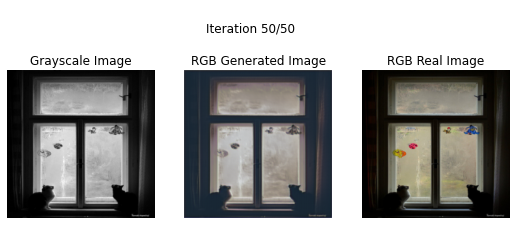

100%|██████████| 50/50 [00:33<00:00,  1.51it/s]



Generator Loss: 10.28022289276123 
Discriminator Loss: 0.558212161064148

Epoch 2/50


 98%|█████████▊| 49/50 [00:24<00:00,  2.03it/s]

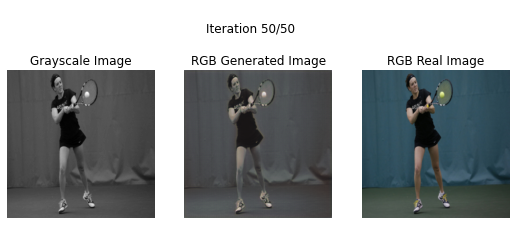

100%|██████████| 50/50 [00:25<00:00,  1.99it/s]



Generator Loss: 8.326115608215332 
Discriminator Loss: 0.43151676654815674

Epoch 3/50


 98%|█████████▊| 49/50 [00:24<00:00,  1.99it/s]

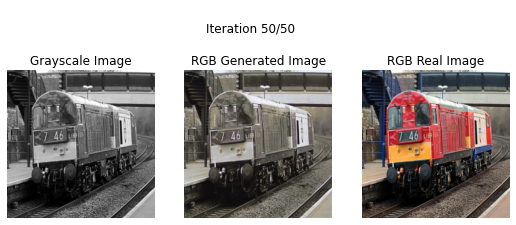

100%|██████████| 50/50 [00:25<00:00,  1.95it/s]



Generator Loss: 9.07119083404541 
Discriminator Loss: 0.20638209581375122

Epoch 4/50


 98%|█████████▊| 49/50 [00:25<00:00,  1.99it/s]

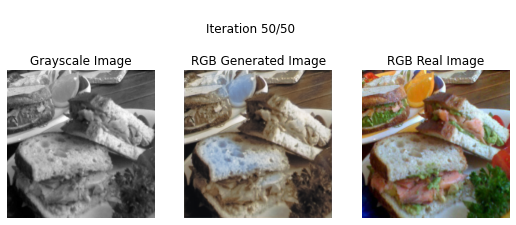

100%|██████████| 50/50 [00:26<00:00,  1.91it/s]



Generator Loss: 7.811906337738037 
Discriminator Loss: 0.3443051874637604

Epoch 5/50


 98%|█████████▊| 49/50 [00:25<00:00,  1.97it/s]

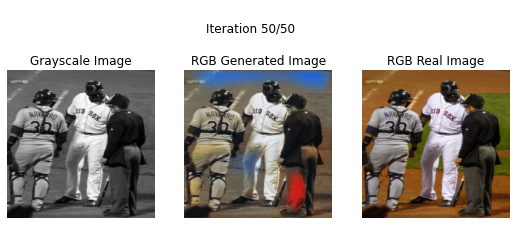

100%|██████████| 50/50 [00:26<00:00,  1.91it/s]



Generator Loss: 9.344649314880371 
Discriminator Loss: 0.49869251251220703

Epoch 6/50


 98%|█████████▊| 49/50 [00:25<00:00,  1.94it/s]

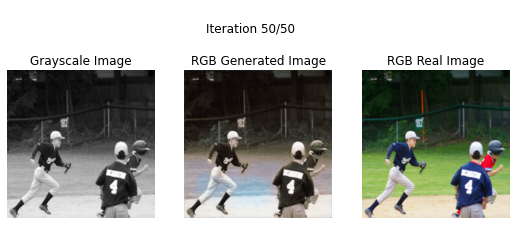

100%|██████████| 50/50 [00:26<00:00,  1.87it/s]



Generator Loss: 8.265437126159668 
Discriminator Loss: 0.11624008417129517

Epoch 7/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.94it/s]

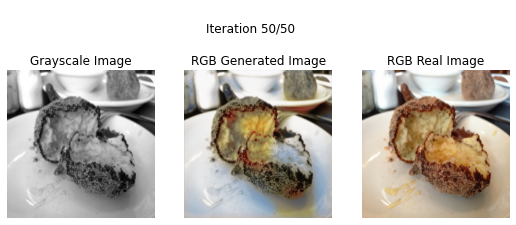

100%|██████████| 50/50 [00:27<00:00,  1.83it/s]



Generator Loss: 8.599794387817383 
Discriminator Loss: 0.5547837615013123

Epoch 8/50


 98%|█████████▊| 49/50 [00:25<00:00,  1.94it/s]

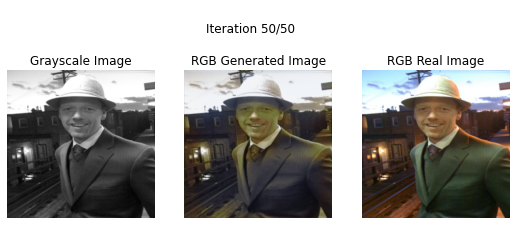

100%|██████████| 50/50 [00:26<00:00,  1.87it/s]



Generator Loss: 7.11007022857666 
Discriminator Loss: 0.48458969593048096

Epoch 9/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.92it/s]

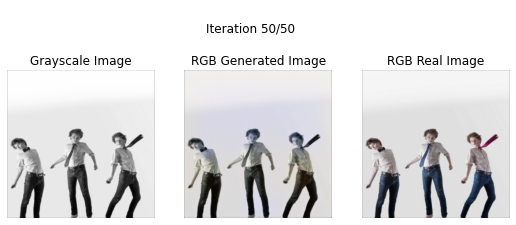

100%|██████████| 50/50 [00:26<00:00,  1.86it/s]



Generator Loss: 9.57448673248291 
Discriminator Loss: 0.18621349334716797

Epoch 10/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.91it/s]

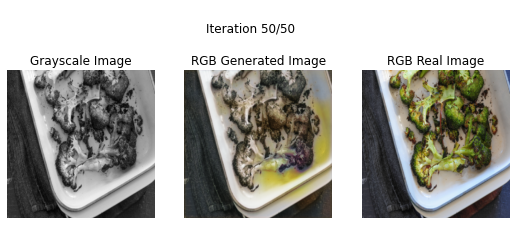

100%|██████████| 50/50 [00:26<00:00,  1.85it/s]



Generator Loss: 7.846801280975342 
Discriminator Loss: 0.3339965343475342

Epoch 11/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.92it/s]

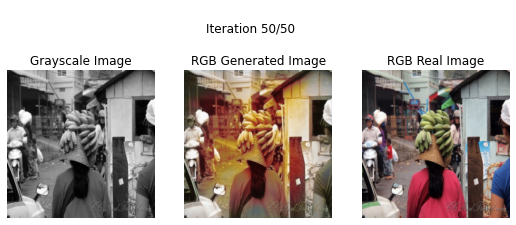

100%|██████████| 50/50 [00:27<00:00,  1.85it/s]



Generator Loss: 9.03624439239502 
Discriminator Loss: 0.4982130527496338

Epoch 12/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.90it/s]

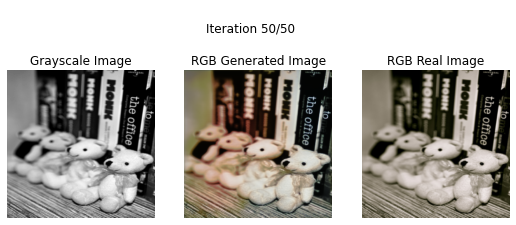

100%|██████████| 50/50 [00:27<00:00,  1.82it/s]



Generator Loss: 7.654644966125488 
Discriminator Loss: 0.3682127594947815

Epoch 13/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.87it/s]

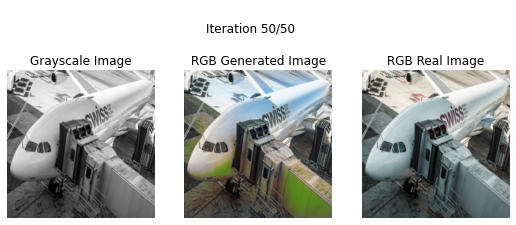

100%|██████████| 50/50 [00:27<00:00,  1.82it/s]



Generator Loss: 8.527985572814941 
Discriminator Loss: 0.6330575346946716

Epoch 14/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.87it/s]

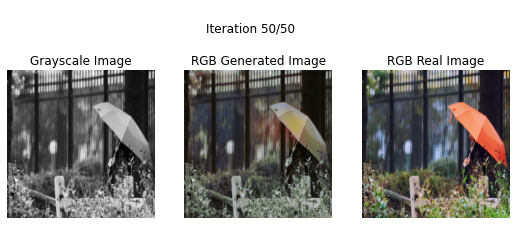

100%|██████████| 50/50 [00:27<00:00,  1.84it/s]



Generator Loss: 8.991884231567383 
Discriminator Loss: 0.6043126583099365

Epoch 15/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.89it/s]

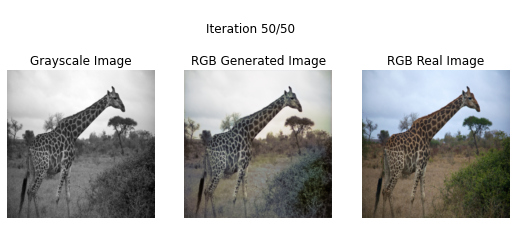

100%|██████████| 50/50 [00:27<00:00,  1.83it/s]



Generator Loss: 9.071124076843262 
Discriminator Loss: 0.1417485475540161

Epoch 16/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.89it/s]

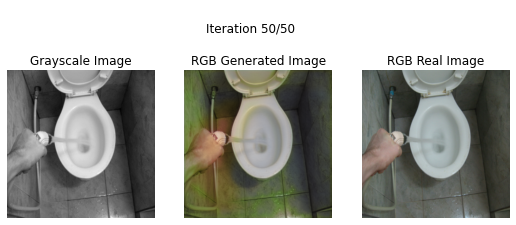

100%|██████████| 50/50 [00:27<00:00,  1.82it/s]



Generator Loss: 8.368844032287598 
Discriminator Loss: 0.7013201713562012

Epoch 17/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.89it/s]

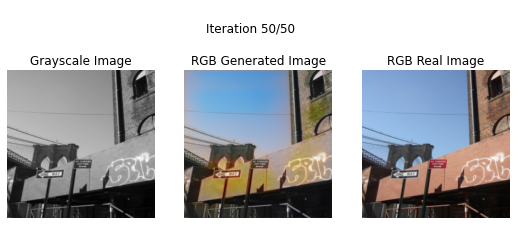

100%|██████████| 50/50 [00:27<00:00,  1.81it/s]



Generator Loss: 7.172295570373535 
Discriminator Loss: 0.733572244644165

Epoch 18/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.89it/s]

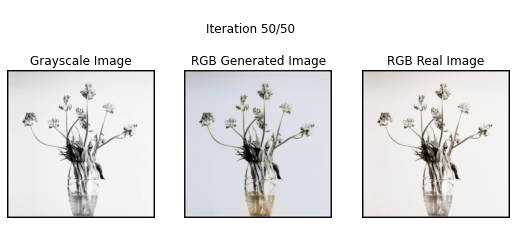

100%|██████████| 50/50 [00:27<00:00,  1.81it/s]



Generator Loss: 9.873231887817383 
Discriminator Loss: 0.5544982552528381

Epoch 19/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.90it/s]

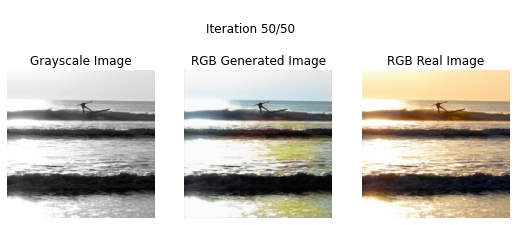

100%|██████████| 50/50 [00:27<00:00,  1.84it/s]



Generator Loss: 8.286081314086914 
Discriminator Loss: 0.5722569227218628

Epoch 20/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.89it/s]

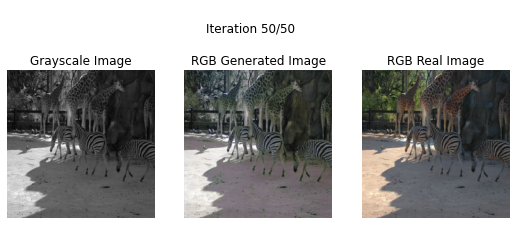

100%|██████████| 50/50 [00:27<00:00,  1.82it/s]



Generator Loss: 9.573817253112793 
Discriminator Loss: 0.4601325988769531

Epoch 21/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.89it/s]

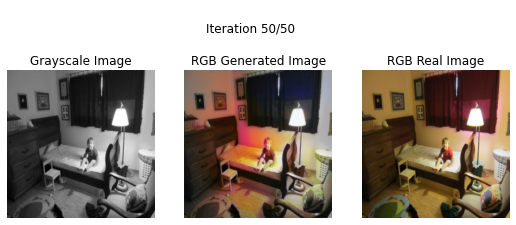

100%|██████████| 50/50 [00:27<00:00,  1.84it/s]



Generator Loss: 8.142406463623047 
Discriminator Loss: 0.5789089798927307

Epoch 22/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.90it/s]

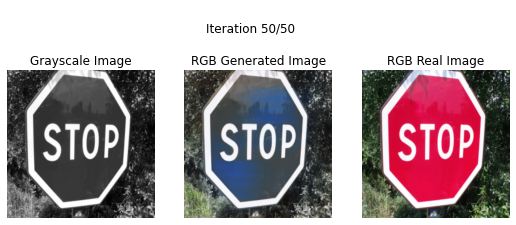

100%|██████████| 50/50 [00:27<00:00,  1.82it/s]



Generator Loss: 7.583914756774902 
Discriminator Loss: 0.5594865679740906

Epoch 23/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.87it/s]

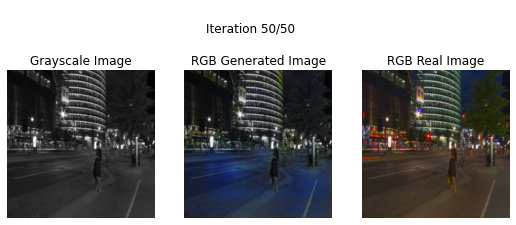

100%|██████████| 50/50 [00:27<00:00,  1.80it/s]



Generator Loss: 7.881115913391113 
Discriminator Loss: 0.5648294687271118

Epoch 24/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.86it/s]

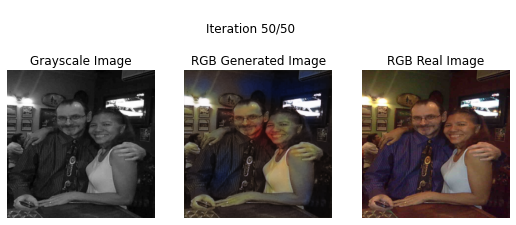

100%|██████████| 50/50 [00:27<00:00,  1.81it/s]



Generator Loss: 7.163830757141113 
Discriminator Loss: 0.8424952030181885

Epoch 25/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.88it/s]

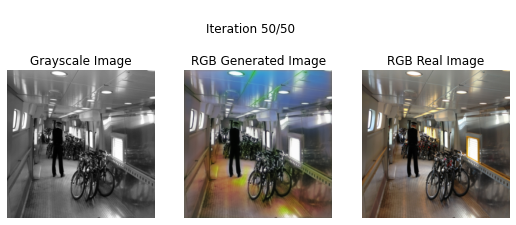

100%|██████████| 50/50 [00:27<00:00,  1.83it/s]



Generator Loss: 7.004561901092529 
Discriminator Loss: 0.7638149857521057

Epoch 26/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.90it/s]

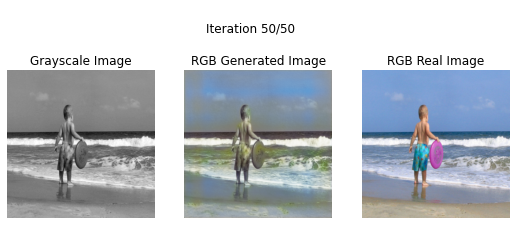

100%|██████████| 50/50 [00:27<00:00,  1.82it/s]



Generator Loss: 9.49478530883789 
Discriminator Loss: 0.39475077390670776

Epoch 27/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.89it/s]

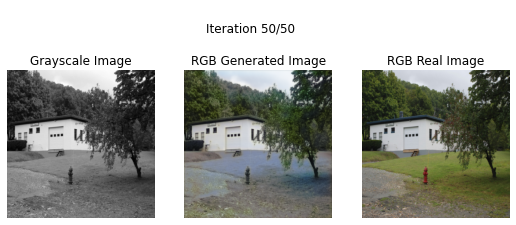

100%|██████████| 50/50 [00:27<00:00,  1.82it/s]



Generator Loss: 9.186490058898926 
Discriminator Loss: 0.39180976152420044

Epoch 28/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.89it/s]

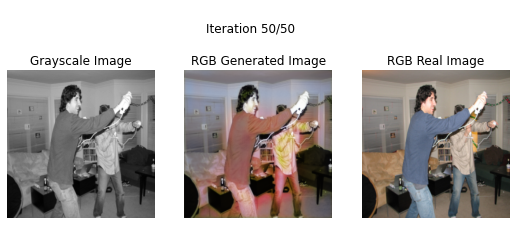

100%|██████████| 50/50 [00:27<00:00,  1.80it/s]



Generator Loss: 8.84977912902832 
Discriminator Loss: 0.3909749388694763

Epoch 29/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.90it/s]

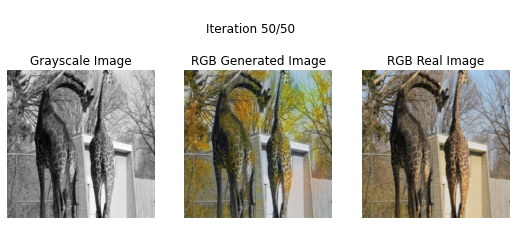

100%|██████████| 50/50 [00:27<00:00,  1.83it/s]



Generator Loss: 9.667407035827637 
Discriminator Loss: 0.39054375886917114

Epoch 30/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.89it/s]

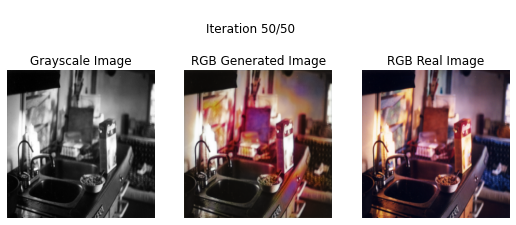

100%|██████████| 50/50 [00:27<00:00,  1.82it/s]



Generator Loss: 8.406835556030273 
Discriminator Loss: 0.5062683820724487

Epoch 31/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.89it/s]

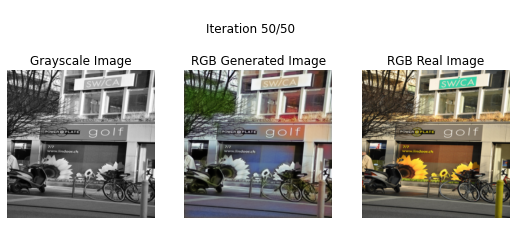

100%|██████████| 50/50 [00:27<00:00,  1.81it/s]



Generator Loss: 9.330937385559082 
Discriminator Loss: 0.4163512587547302

Epoch 32/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.89it/s]

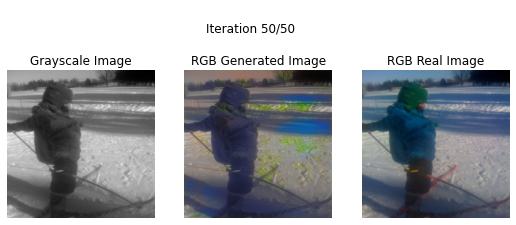

100%|██████████| 50/50 [00:27<00:00,  1.80it/s]



Generator Loss: 8.489852905273438 
Discriminator Loss: 0.45044761896133423

Epoch 33/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.89it/s]

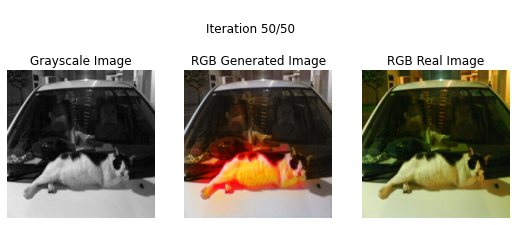

100%|██████████| 50/50 [00:27<00:00,  1.81it/s]



Generator Loss: 7.20473575592041 
Discriminator Loss: 1.1419252157211304

Epoch 34/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.89it/s]

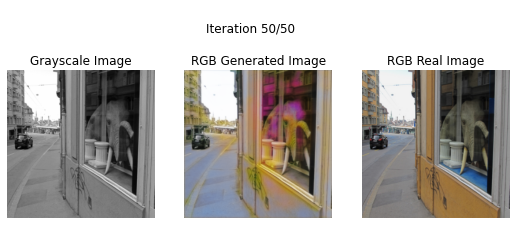

100%|██████████| 50/50 [00:27<00:00,  1.81it/s]



Generator Loss: 9.614640235900879 
Discriminator Loss: 0.41957685351371765

Epoch 35/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.86it/s]

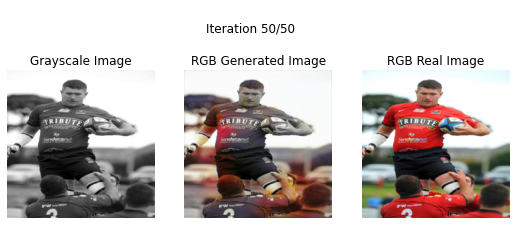

100%|██████████| 50/50 [00:27<00:00,  1.81it/s]



Generator Loss: 9.44642162322998 
Discriminator Loss: 0.3043891489505768

Epoch 36/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.86it/s]

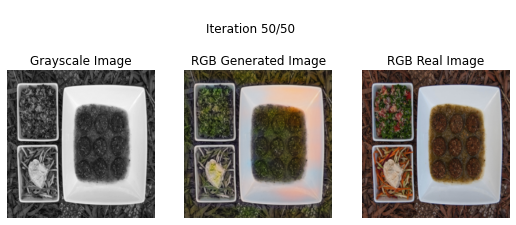

100%|██████████| 50/50 [00:27<00:00,  1.81it/s]



Generator Loss: 8.452474594116211 
Discriminator Loss: 0.5121599435806274

Epoch 37/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.89it/s]

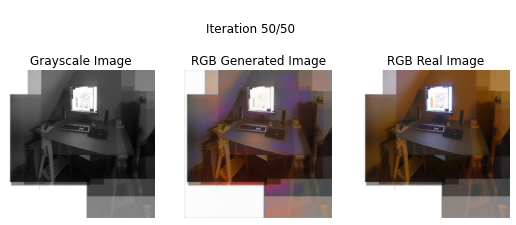

100%|██████████| 50/50 [00:27<00:00,  1.83it/s]



Generator Loss: 7.036631107330322 
Discriminator Loss: 0.593483567237854

Epoch 38/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.90it/s]

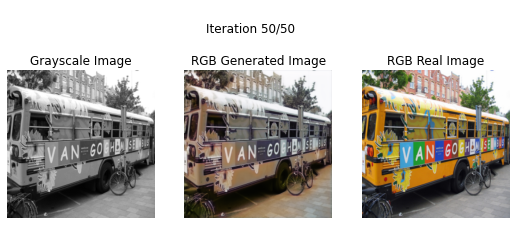

100%|██████████| 50/50 [00:27<00:00,  1.82it/s]



Generator Loss: 9.614377975463867 
Discriminator Loss: 0.06759458780288696

Epoch 39/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.89it/s]

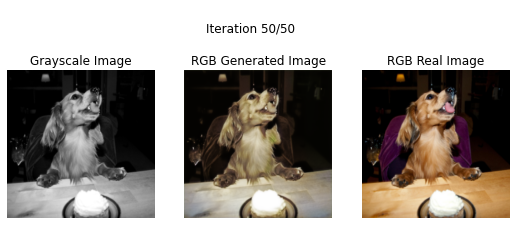

100%|██████████| 50/50 [00:27<00:00,  1.80it/s]



Generator Loss: 7.569041728973389 
Discriminator Loss: 0.12292449921369553

Epoch 40/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.90it/s]

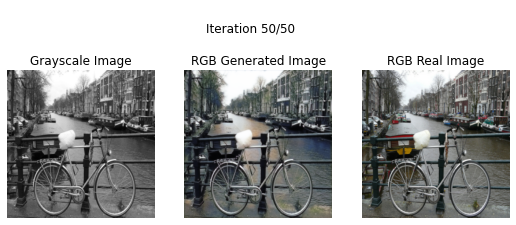

100%|██████████| 50/50 [00:27<00:00,  1.82it/s]



Generator Loss: 9.4771089553833 
Discriminator Loss: 0.12725692987442017

Epoch 41/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.89it/s]

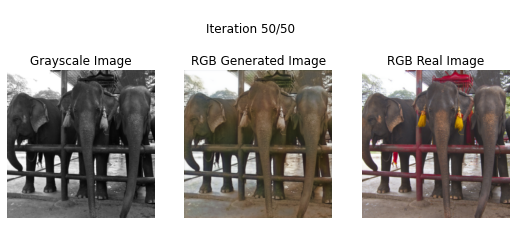

100%|██████████| 50/50 [00:27<00:00,  1.82it/s]



Generator Loss: 9.58203411102295 
Discriminator Loss: 0.03690570220351219

Epoch 42/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.89it/s]

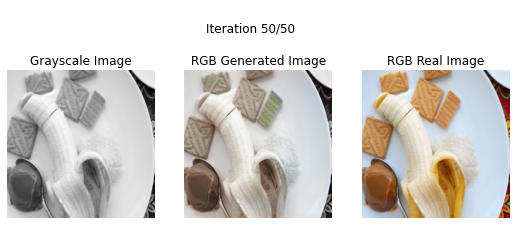

100%|██████████| 50/50 [00:27<00:00,  1.82it/s]



Generator Loss: 9.551088333129883 
Discriminator Loss: 0.028901921585202217

Epoch 43/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.90it/s]

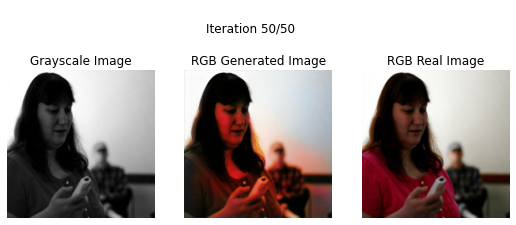

100%|██████████| 50/50 [00:27<00:00,  1.82it/s]



Generator Loss: 6.407677173614502 
Discriminator Loss: 1.3408949375152588

Epoch 44/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.88it/s]

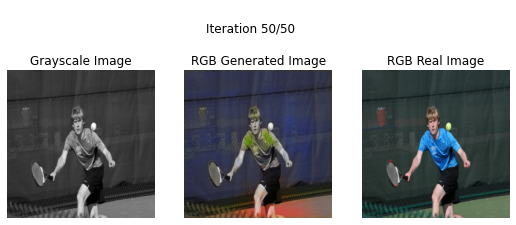

100%|██████████| 50/50 [00:27<00:00,  1.82it/s]



Generator Loss: 8.032526016235352 
Discriminator Loss: 0.49711835384368896

Epoch 45/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.91it/s]

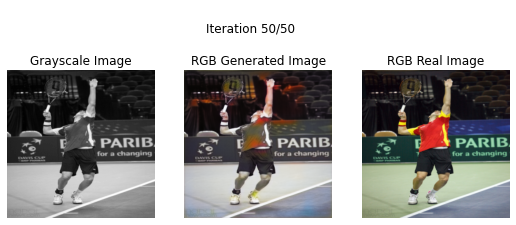

100%|██████████| 50/50 [00:27<00:00,  1.83it/s]



Generator Loss: 10.073087692260742 
Discriminator Loss: 0.055266283452510834

Epoch 46/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.88it/s]

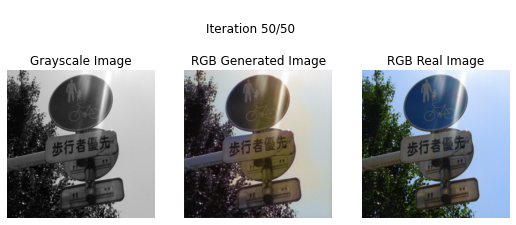

100%|██████████| 50/50 [00:27<00:00,  1.81it/s]



Generator Loss: 9.780804634094238 
Discriminator Loss: 0.037816643714904785

Epoch 47/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.89it/s]

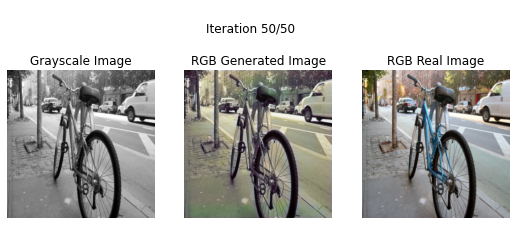

100%|██████████| 50/50 [00:27<00:00,  1.81it/s]



Generator Loss: 11.147672653198242 
Discriminator Loss: 0.01416555605828762

Epoch 48/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.88it/s]

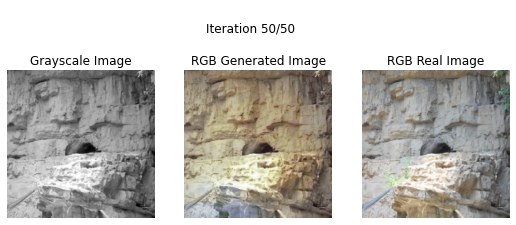

100%|██████████| 50/50 [00:27<00:00,  1.81it/s]



Generator Loss: 10.302382469177246 
Discriminator Loss: 0.010476840659976006

Epoch 49/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.87it/s]

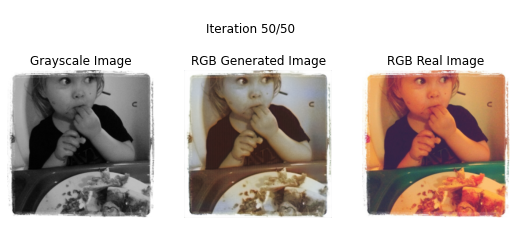

100%|██████████| 50/50 [00:27<00:00,  1.80it/s]



Generator Loss: 10.977678298950195 
Discriminator Loss: 0.009021682664752007

Epoch 50/50


 98%|█████████▊| 49/50 [00:27<00:00,  1.90it/s]

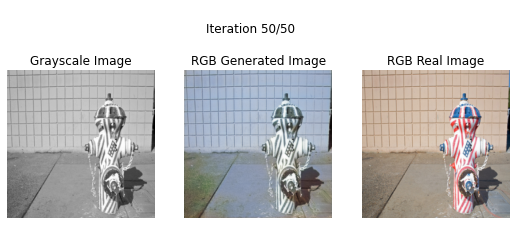

100%|██████████| 50/50 [00:28<00:00,  1.78it/s]


Generator Loss: 10.405863761901855 
Discriminator Loss: 0.008967004716396332
Training time: 1372.73 s


In [ ]:
GrayRGB_dataset = GrayRGB(train_paths)

gray_discriminator = PatchGAN(in_channels = 4).to(device)
gray_generator = UNet(out_channels = 3).to(device)

start_time = time.time()
train(gray_discriminator, gray_generator, device, GrayRGB_dataset, lr, batch_size, n_workers, n_epochs)
elapsed_time = time.time() - start_time
print("Training time: %.2f s" % elapsed_time)

# Save the weights
torch.save(gray_generator.state_dict(), '/content/gray_generator_weights.pt')

# Free GPU memory
torch.cuda.empty_cache()

## Training with grayscale to RGB with SSIM Loss


Epoch 1/50


 98%|█████████▊| 49/50 [00:27<00:00,  1.84it/s]

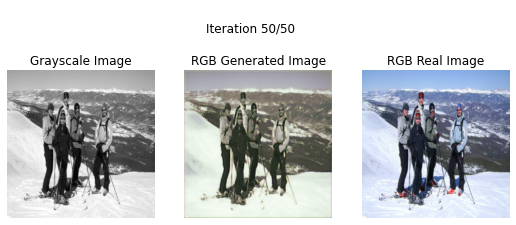

100%|██████████| 50/50 [00:28<00:00,  1.78it/s]



Generator Loss: 7.290300369262695 
Discriminator Loss: 0.5875139236450195

Epoch 2/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.86it/s]

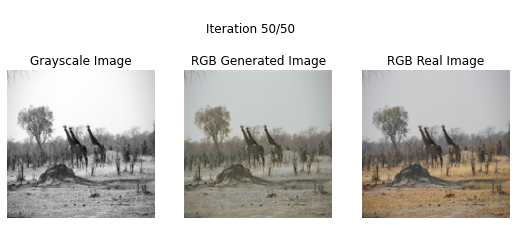

100%|██████████| 50/50 [00:27<00:00,  1.81it/s]



Generator Loss: 7.690684795379639 
Discriminator Loss: 0.35037994384765625

Epoch 3/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.85it/s]

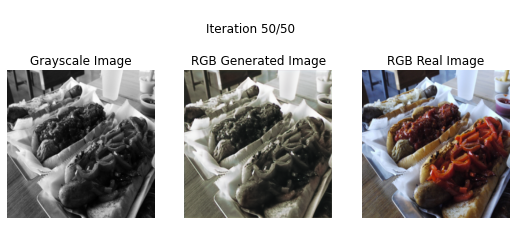

100%|██████████| 50/50 [00:27<00:00,  1.80it/s]



Generator Loss: 8.004667282104492 
Discriminator Loss: 0.5223330855369568

Epoch 4/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.87it/s]

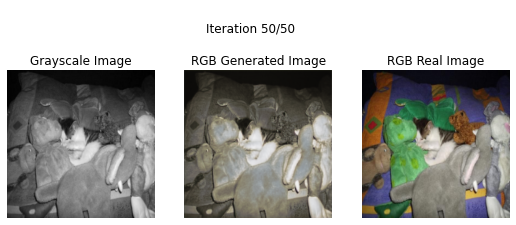

100%|██████████| 50/50 [00:27<00:00,  1.81it/s]



Generator Loss: 6.608403205871582 
Discriminator Loss: 0.41316190361976624

Epoch 5/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.86it/s]

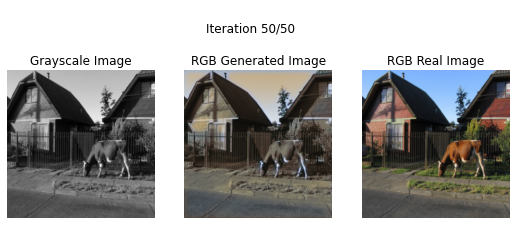

100%|██████████| 50/50 [00:27<00:00,  1.81it/s]



Generator Loss: 8.330899238586426 
Discriminator Loss: 0.16987863183021545

Epoch 6/50


 98%|█████████▊| 49/50 [00:26<00:00,  1.84it/s]

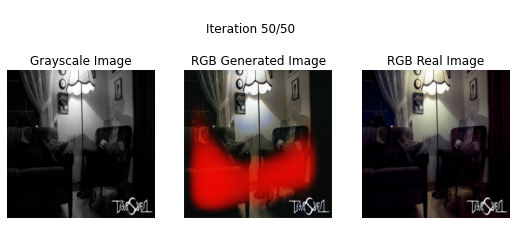

100%|██████████| 50/50 [00:27<00:00,  1.80it/s]



Generator Loss: 7.578054904937744 
Discriminator Loss: 0.9511078596115112

Epoch 7/50


 98%|█████████▊| 49/50 [00:27<00:00,  1.85it/s]

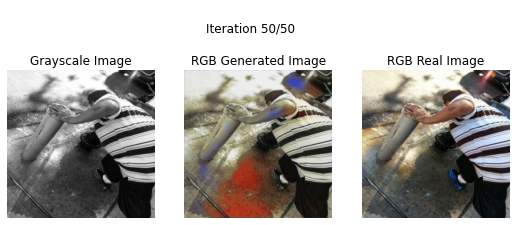

100%|██████████| 50/50 [00:28<00:00,  1.78it/s]



Generator Loss: 8.526939392089844 
Discriminator Loss: 0.6123238801956177

Epoch 8/50


 98%|█████████▊| 49/50 [00:27<00:00,  1.85it/s]

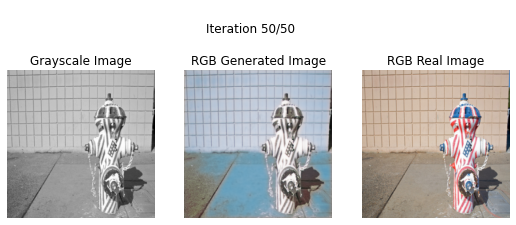

100%|██████████| 50/50 [00:27<00:00,  1.79it/s]



Generator Loss: 8.39316463470459 
Discriminator Loss: 0.685523271560669

Epoch 9/50


 98%|█████████▊| 49/50 [00:27<00:00,  1.85it/s]

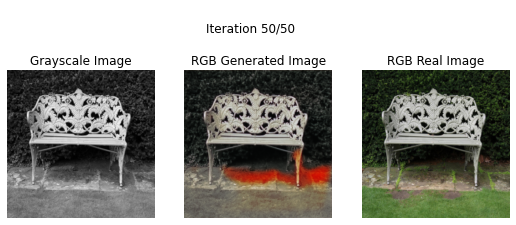

100%|██████████| 50/50 [00:27<00:00,  1.80it/s]



Generator Loss: 7.693925857543945 
Discriminator Loss: 0.5417870879173279

Epoch 10/50


 98%|█████████▊| 49/50 [00:27<00:00,  1.86it/s]

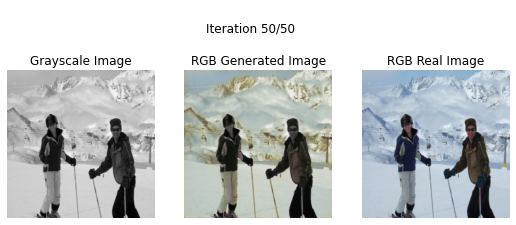

100%|██████████| 50/50 [00:28<00:00,  1.78it/s]



Generator Loss: 8.351061820983887 
Discriminator Loss: 0.5111265182495117

Epoch 11/50


 98%|█████████▊| 49/50 [00:27<00:00,  1.87it/s]

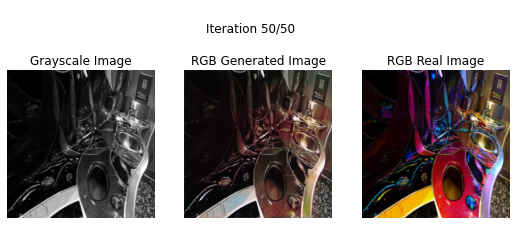

100%|██████████| 50/50 [00:27<00:00,  1.79it/s]



Generator Loss: 7.6403045654296875 
Discriminator Loss: 0.5416908264160156

Epoch 12/50


 98%|█████████▊| 49/50 [00:27<00:00,  1.86it/s]

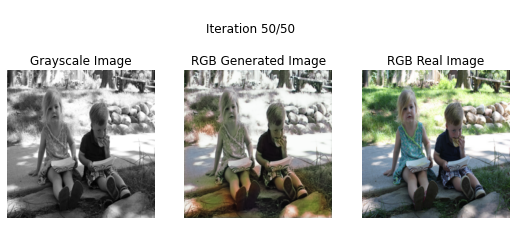

100%|██████████| 50/50 [00:27<00:00,  1.79it/s]



Generator Loss: 8.078657150268555 
Discriminator Loss: 0.492090106010437

Epoch 13/50


 98%|█████████▊| 49/50 [00:27<00:00,  1.85it/s]

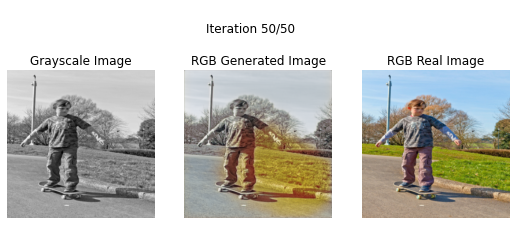

100%|██████████| 50/50 [00:27<00:00,  1.79it/s]



Generator Loss: 7.098915100097656 
Discriminator Loss: 0.7709866166114807

Epoch 14/50


 98%|█████████▊| 49/50 [00:27<00:00,  1.86it/s]

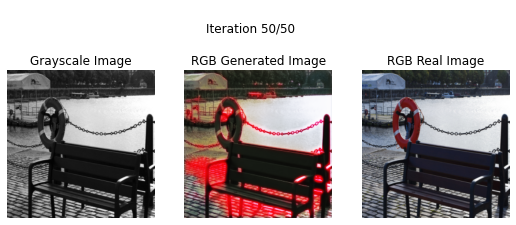

100%|██████████| 50/50 [00:27<00:00,  1.80it/s]



Generator Loss: 9.032684326171875 
Discriminator Loss: 0.4589802920818329

Epoch 15/50


 80%|████████  | 40/50 [00:22<00:05,  1.82it/s]

In [ ]:
ssim_gray_discriminator = PatchGAN(in_channels = 4).to(device)
ssim_gray_generator = UNet(out_channels = 3).to(device)

train(ssim_gray_discriminator, ssim_gray_generator, device, GrayRGB_dataset, lr, batch_size, n_workers, n_epochs, ssim_loss = True)

# Save the weights
torch.save(ssim_gray_generator.state_dict(), '/content/gray_generator_ssim_loss_weights.pt')

# Free GPU memory
torch.cuda.empty_cache()

## Training with Lab to RGB
We are generating an RGB image from Lab color space, exploiting the fact that channel L represents the luminance and we can use it as a sort of grayscale image. This will let us generate only 2 channels (a and b) to recreate the final RGB image (with a conversion from Lab to RGB). This will benefit the training process.

In [ ]:
LabRGB_dataset = LabRGB(train_paths)

lab_discriminator = PatchGAN(in_channels = 3).to(device)
lab_generator = UNet(out_channels = 2).to(device)

start_time = time.time()
train(lab_discriminator, lab_generator, device, LabRGB_dataset, lr, batch_size, n_workers, n_epochs, lab = True)
elapsed_time = time.time() - start_time
print("Training time: %.2f s" % elapsed_time)

# Save the weights
torch.save(lab_generator.state_dict(), 'lab_generator_weights.pt')

# Free GPU memory
torch.cuda.empty_cache()

## WGAN training

In [ ]:
#aggiornata alle 19:53 -> risultati ancora leggermente strani ma molto meglio

from torch.autograd import Variable
from torch import autograd

def calculate_gradient_penalty(disc, device, real_images, gray_im, fake_images):
    batch_size, channel, height, width = real_images.shape
    eps_shape = [batch_size]+[1]*(len(real_images.shape)-1)
    eps = torch.rand(eps_shape, device=device)
    interpolated = eps * real_images + ((1 - eps) * fake_images)
    # calculate probability of interpolated examples
    score_interpolated = disc(gray_im, interpolated)

    # calculate gradients of probabilities with respect to examples
    gradients = autograd.grad(outputs=score_interpolated,
                                inputs=interpolated,
                                grad_outputs=torch.ones(score_interpolated.size(), device=device),
                                create_graph=True,
                                retain_graph=True,
                                only_inputs=True,
                                allow_unused=True)[0]
    
    grad_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
    return grad_penalty

def W_train_step(disc, gen, device, dl, opt_disc, opt_gen, iter, lambda_term):
    i=1

    for data in tqdm(dl):
        gray = data['gray'].to(device)
        rgb = data['rgb'].to(device)

        d_loss_real = 0
        d_loss_fake = 0
        
        disc.zero_grad()
        gen.zero_grad()
    
        # Train discriminator with real images
        d_loss_real = disc(gray, rgb)

        # Train with fake images
        fake_images = gen(gray)
        d_loss_fake = disc(gray, fake_images.detach())

        # Train with gradient penalty
        gradient_penalty = calculate_gradient_penalty(disc, device, rgb, gray, fake_images)

        d_loss = (d_loss_fake - d_loss_real).mean() + (lambda_term*gradient_penalty.mean())
        d_loss.backward()
        opt_disc.step()

        if(i%iter==0):
            # Generator update
            disc.zero_grad()
            gen.zero_grad()
            
            # train generator
            fake_images = gen(gray)
            g_loss = -disc(gray, fake_images)
            g_loss = g_loss.mean()
            g_loss.backward()
            opt_gen.step()

        if(i==500):
            print(f'\nGenerator -> g_loss: {g_loss}')
            print(f'Discriminator -> loss_fake: {d_loss_fake.mean()}, loss_real: {d_loss_real.mean()}')
            visualize(gray[0], rgb[0], fake_images[0], i, len(dl), "RGB")
        i=i+1

In [ ]:
def W_train(discriminator, generator, device, dataset, learning_rate, batch_size, n_workers, n_epochs):

    beta1 = 0.5
    beta2 = 0.999
    iter = 5
    lambda_term = 0.2
    lambda_term = 10

    opt_disc = optim.Adam(discriminator.parameters(), lr = learning_rate, betas = (beta1, beta2))
    opt_gen = optim.Adam(generator.parameters(), lr = learning_rate, betas = (beta1, beta2))

    train_dl = DataLoader(dataset, batch_size = batch_size, shuffle = True, num_workers = n_workers)

    for epoch in range(n_epochs):
        print(f"\nEpoch {epoch+1}/{n_epochs}")
        W_train_step(discriminator, generator, device, train_dl, opt_disc, opt_gen, iter, lambda_term)


Epoch 1/10


 98%|█████████▊| 49/50 [00:58<00:01,  1.06s/it]


Generator -> g_loss: -0.01676339842379093
Discriminator -> loss_fake: -0.018963636830449104, loss_real: -0.008620211854577065


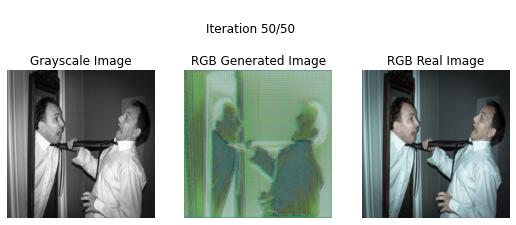

100%|██████████| 50/50 [01:00<00:00,  1.22s/it]


Time of training-60.82360625267029

Epoch 2/10


 98%|█████████▊| 49/50 [00:54<00:01,  1.04s/it]


Generator -> g_loss: -0.021536879241466522
Discriminator -> loss_fake: -0.018764236941933632, loss_real: -0.0049225823022425175


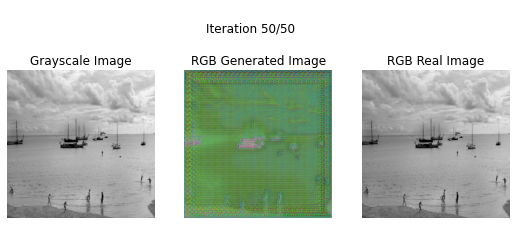

100%|██████████| 50/50 [00:57<00:00,  1.14s/it]


Time of training-57.20167636871338

Epoch 3/10


 98%|█████████▊| 49/50 [00:55<00:01,  1.04s/it]


Generator -> g_loss: -0.022424964234232903
Discriminator -> loss_fake: -0.024965817108750343, loss_real: -0.01013884972780943


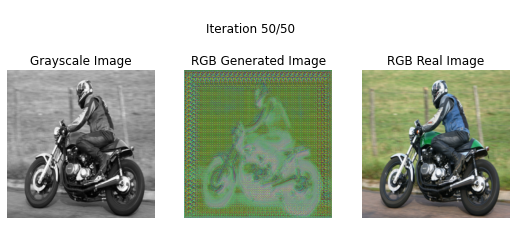

100%|██████████| 50/50 [00:57<00:00,  1.16s/it]


Time of training-57.7672336101532

Epoch 4/10


 98%|█████████▊| 49/50 [00:54<00:01,  1.04s/it]


Generator -> g_loss: -0.029644042253494263
Discriminator -> loss_fake: -0.027650734409689903, loss_real: -0.01006078626960516


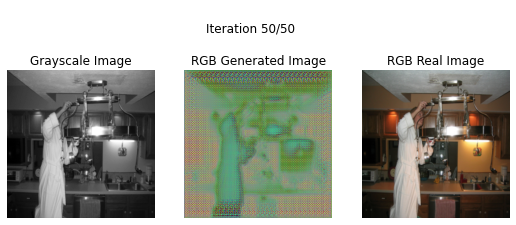

100%|██████████| 50/50 [00:57<00:00,  1.15s/it]


Time of training-57.59808135032654

Epoch 5/10


 98%|█████████▊| 49/50 [00:55<00:01,  1.04s/it]


Generator -> g_loss: -0.027227677404880524
Discriminator -> loss_fake: -0.030195031315088272, loss_real: -0.009457805193960667


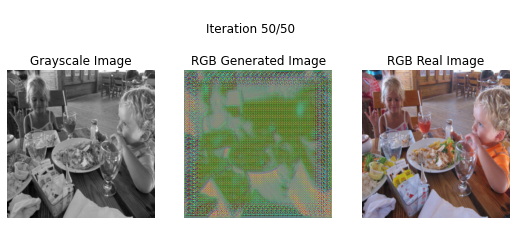

100%|██████████| 50/50 [00:57<00:00,  1.16s/it]


Time of training-57.84760141372681

Epoch 6/10


 98%|█████████▊| 49/50 [00:55<00:01,  1.04s/it]


Generator -> g_loss: -0.029515987262129784
Discriminator -> loss_fake: -0.028654705733060837, loss_real: -0.005642956588417292


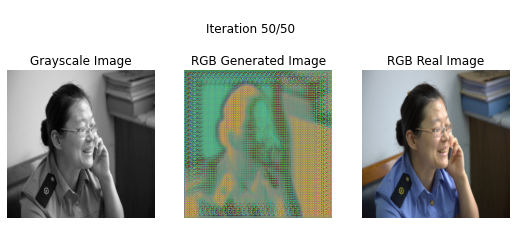

100%|██████████| 50/50 [00:57<00:00,  1.15s/it]


Time of training-57.72336530685425

Epoch 7/10


 98%|█████████▊| 49/50 [00:55<00:01,  1.04s/it]


Generator -> g_loss: -0.044833630323410034
Discriminator -> loss_fake: -0.04725024476647377, loss_real: -0.026801245287060738


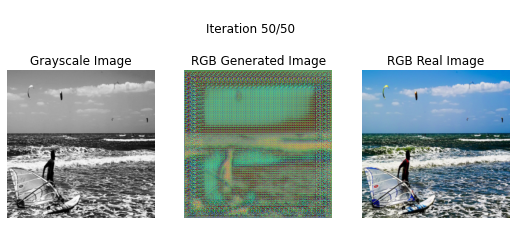

100%|██████████| 50/50 [00:57<00:00,  1.16s/it]


Time of training-57.786712408065796

Epoch 8/10


 98%|█████████▊| 49/50 [00:55<00:01,  1.04s/it]


Generator -> g_loss: -0.050804708153009415
Discriminator -> loss_fake: -0.05126272886991501, loss_real: -0.032256316393613815


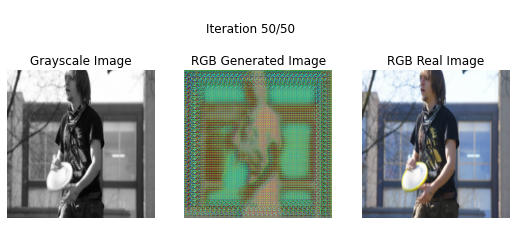

100%|██████████| 50/50 [00:58<00:00,  1.16s/it]


Time of training-58.08604836463928

Epoch 9/10


 98%|█████████▊| 49/50 [00:55<00:01,  1.04s/it]


Generator -> g_loss: -0.03028896264731884
Discriminator -> loss_fake: -0.031128302216529846, loss_real: -0.008688929490745068


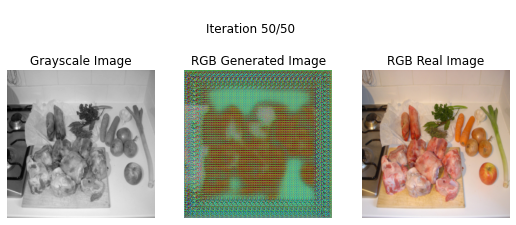

100%|██████████| 50/50 [00:58<00:00,  1.16s/it]


Time of training-58.11186718940735

Epoch 10/10


 98%|█████████▊| 49/50 [00:54<00:01,  1.04s/it]


Generator -> g_loss: -0.04862864315509796
Discriminator -> loss_fake: -0.05132381245493889, loss_real: -0.02558697573840618


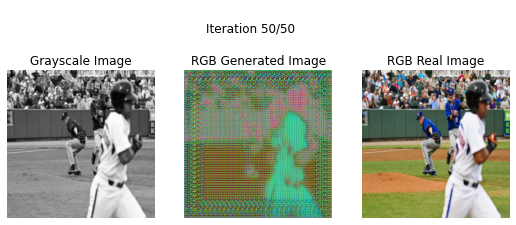

100%|██████████| 50/50 [00:57<00:00,  1.15s/it]

Time of training-57.60364651679993


In [ ]:
GrayRGB_dataset = GrayRGB(train_paths)

WG = UNet(out_channels = 3).to(device)
WD = Critic(in_channels = 4).to(device)

W_train(WD, WG, device, GrayRGB_dataset, lr, batch_size, n_workers, n_epochs)

# Save the weights
torch.save(WG.state_dict(), '/content/gray_generator_wgan_weights.pt')

# Free GPU memory
torch.cuda.empty_cache()

# Analysis

In [ ]:
# Load the weights
generator = UNet().to(device)

generator.load_state_dict(torch.load('/content/gray_generator_weights.pt')) # SISTEMARE NOME PESI

gray_testing_ds = GrayRGB(test_paths)
gray_testing_dl = DataLoader(gray_testing_ds, batch_size = 10, shuffle = True)

gray_testing = next(iter(gray_testing_dl))

print(type(gray_testing["gray"]))
print(gray_testing["gray"].shape)

gray_images = gray_testing["gray"].to(device)
gray_real_images = gray_testing["rgb"]

gray_generated_images = generator(gray_images)

print(gray_generated_images.shape)

<class 'torch.Tensor'>
torch.Size([10, 1, 256, 256])
torch.Size([10, 3, 256, 256])


## Testing

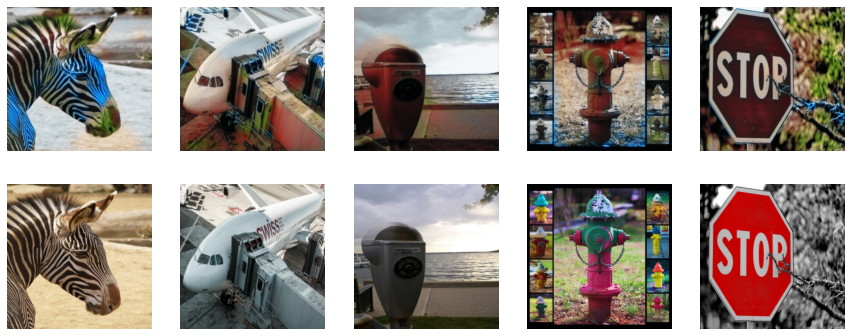

In [ ]:
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
axes = axes.ravel()
for i, ax in enumerate(axes):
    if i < 5:
        ax.imshow(gray_generated_images[i].permute(1,2,0).cpu().detach().numpy().astype('float32'))
    else:
        ax.imshow(gray_real_images[i - 5].permute(1,2,0))
    ax.axis('off')

## Metrics

### SSIM
It measures the structural similarity between two images and is more robust to change in pixel values.

In [ ]:
ssim = functional.structural_similarity_index_measure(preds = gray_generated_images.cpu(), target = gray_real_images)
print(1 - ssim.item())

0.11052912473678589


### CMI
This metric measures the mutual information between the real and generated chrominance channels, which are typically used to encode color information.

Computing Chroma Mutual Information (CMI) involves the following steps:

1.   Separate the real and generated images into their chrominance and luminance channels. This is typically done using a color space transformation, such as YUV or LAB.
2.   Compute the joint and marginal distributions of the chrominance channels for the real and generated images.
3.   Calculate the mutual information between the real and generated chrominance channels using the joint and marginal distributions:
 
 *CMI = H(real chrominance) + H(generated chrominance) - H(real chrominance, generated chrominance)*

 Where H is the entropy of the distribution.

4.   The mutual information is then normalized by dividing it by the maximum possible mutual information between the real and generated chrominance channels.

In [ ]:
from sklearn.metrics import mutual_info_score

def chroma_mutual_info(real_img, generated_img):
    """Computes the Chroma Mutual Information (CMI) between real and generated images using the LAB color space."""
    real_lab = color.rgb2lab(real_img.detach().permute(1,2,0).numpy())
    generated_lab = color.rgb2lab(generated_img.cpu().detach().permute(1,2,0).numpy())
    
    real_chroma = real_lab[:,:,1:3].reshape(-1, 2)
    generated_chroma = generated_lab[:,:,1:3].reshape(-1, 2)
    
    # Flatten chroma channels into 1D arrays
    real_chroma = real_chroma.reshape(-1)
    generated_chroma = generated_chroma.reshape(-1)

    # Compute mutual information
    mi = mutual_info_score(real_chroma, generated_chroma)
    
    # Normalize mutual information
    cmi = mi / np.log2(256*256)
    
    return torch.tensor(cmi, dtype=torch.float32)


In [ ]:
cmi = chroma_mutual_info(gray_generated_images[0].cpu(), gray_real_images[0])
print(cmi)

tensor(0.6191)


/usr/local/lib/python3.8/dist-packages/sklearn/metrics/cluster/_supervised.py:65: UserWarning: Clustering metrics expects discrete values but received continuous values for label, and continuous values for target
  warnings.warn(msg, UserWarning)
